<a href="https://colab.research.google.com/github/hwater27/EmuStudy2023-1/blob/main/DeepLearningFromScratch_Chapter07.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

#Chapter 1 ~ 6 Review

##Functions

In [ ]:
def identity_function(x):
    return x

def step_function(x):
    return np.array(x > 0, dtype=np.int32)

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def relu(x):
    return np.maximum(0, x)

def softmax(x):
    if x.ndim == 2:
        x = x.T
        x = x - np.max(x, axis=0)
        y = np.exp(x) / np.sum(np.exp(x), axis=0)
        return y.T

    x = x - np.max(x)
    return np.exp(x) / np.sum(np.exp(x))

##Activations

In [ ]:
'''<<Activations>>
*************************************************************************


Methods
--------
[Constructor] instance = Class()
[forward] instance.forward()
[backward] instance.backward()

Activation dictionary는 다음과 같다.
------------------------------------
activation_layer = {'step'      : Step,
                    'sigmoid'   : Sigmoid,
                    'relu'      : Relu}
*************************************************************************'''

class Step:     # 연습용으로 개인적으로 만들어 보았습니다.
    def __init__(self):
        pass

    def forward(self, x):
        return step_function(x)

    def backward(self, dout):   # 꼴을 보면 gradient descent가 왜 먹히지 않는지 확인할 수 있습니다.
        return 0


class Relu:
    def __init__(self):
        self.mask = None

    def forward(self, x):
        self.mask = (x <= 0)
        out = x.copy()
        out[self.mask] = 0

        return out

    def backward(self, dout):
        dout[self.mask] = 0
        dx = dout

        return dx


class Sigmoid:
    def __init__(self):
        self.out = None

    def forward(self, x):
        out = sigmoid(x)
        self.out = out
        return out

    def backward(self, dout):
        dx = dout * (1.0 - self.out) * self.out

        return dx

In [ ]:
activation_layer = {'step':Step, 'sigmoid':Sigmoid, 'relu':Relu}

NameError: ignored

In [ ]:
'''<<Affine Layer>>
*************************************************************************
Affine은 기존의 y = WX + b 연산을 수행하는 layer로,
행렬곱을 통해 다음 기능이 가능하도록 구현되었다는 것만이 다른 점이다.

1. Broadcasting
2. Batch calculation
3. Back propagation
*************************************************************************'''

class Affine:
    def __init__(self, W, b):
        self.W = W
        self.b = b

        self.x = None
        self.original_x_shape = None
        self.dW = None
        self.db = None

    def forward(self, x):
        self.original_x_shape =x.shape
        x = x.reshape(x.shape[0], -1)
        self.x = x

        out = np.dot(self.x, self.W) + self.b

        return out

    def backward(self, dout):
        dx = np.dot(dout, self.W.T)
        self.dW = np.dot(self.x.T, dout)
        self.db = np.sum(dout, axis=0)

        dx = dx.reshape(*self.original_x_shape)
        return dx

##Losses

In [ ]:
def mean_squared_error(y, t):
    return 0.5 * np.sum((y-t)**2)   # Numpy broadcasting available


def cross_entropy_error(y, t):
    if y.ndim == 1:                 # (n, ) -> (n, 1)
        t = t.reshape(1, t.size)
        y = y.reshape(1, y.size)

    if t.size == y.size:        # If y is one-hot encoding,
        t = t.argmax(axis=1)    # change it to numerical label

    batch_size = y.shape[0]         # Get the length of y (=batch size)

    return -np.sum(np.log(y[np.arange(batch_size), t] + 1e-7)) / batch_size # Divide by batch size, to get MEAN value of multiple LOSSES in a batch size


def softmax_loss(X, t):
    y = softmax(X)
    return cross_entropy_error(y, t)

In [ ]:
class SoftmaxWithLoss:
    def __init__(self):
        self.loss = None
        self.y = None
        self.t = None

    def forward(self, x, t):
        self.t = t
        self.y = softmax(x)
        self.loss = cross_entropy_error(self.y, self.t)

        return self.loss

    def backward(self, dout=1):
        batch_size = self.t.shape[0]
        if self.t.size == self.y.size:
            dx = (self.y - self.t) / batch_size
        else:
            dx = self.y.copy()
            dx[np.arange(batch_size), self.t] -= 1
            dx = dx / batch_size

        return dx

##Gradient

In [ ]:
def numerical_gradient(f, x):
    h = 1e-4
    grad = np.zeros_like(x)

    it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
    while not it.finished:
        idx = it.multi_index
        tmp_val = x[idx]
        x[idx] = float(tmp_val) + h
        fxh1 = f(x)

        x[idx] = tmp_val - h
        fxh2 = f(x)
        grad[idx] = (fxh1 - fxh2) / (2*h)

        x[idx] = tmp_val
        it.iternext()

    return grad

##Optimizer

In [ ]:
'''<<Optimizer>>
*************************************************************************
Back propagation을 통해 계산된 dL/dW를 이용하여 가중치 W를 갱신한다.

Methods
--------
[Constructor] instance = Class(*params)
    : *params와 그 기본값은 optimizer_class_dict에서 소개한다.

[update] instance.update(params, grads)
    : params, grads는 각각 W(weight), dL/dW(gradient)를 저장한 dictionary이다.


Optimizer dictionary는 다음과 같다.
----------------------------------
optimizer_class_dict = {'sgd'       : SGD,          # lr=0.01
                        'momentum'  : Momentum,     # lr=0.01, momentum=0.9
                        'nesterov'  : Nesterov,     # lr=0.01, momentum=0.9
                        'adagrad'   : AdaGrad,      # lr=0.01
                        'rmsprop'   : RMSprop,      # lr=0.01, decay_rate=0.99
                        'adam'      : Adam}         # lr=0.001, beta1=0.9, beta2=0.999
*************************************************************************'''

class SGD:
    def __init__(self, lr=0.01):
        self.lr = lr

    def update(self, params, grads):
        for key in params.keys():
            params[key] -= self.lr * grads[key]


class Momentum:
    def __init__(self, lr=0.01, momentum=0.9):
        self.lr = lr
        self.momentum = momentum
        self.v = None

    def update(self, params, grads):
        if self.v is None:
            self.v = {}
            for key, val in params.items():
                self.v[key] = np.zeros_like(val)

        for key in params.keys():
            self.v[key] = self.momentum * self.v[key] - self.lr * grads[key]
            params[key] += self.v[key]


class Nesterov:
    def __init__(self, lr=0.01, momentum=0.9):
        self.lr = lr
        self.momentum = momentum
        self.v = None

    def update(self, params, grads):
        if self.v is None:
            self.v = {}
            for key, val in params.items():
                self.v[key] = np.zeros_like(val)

        for key in params.keys():
            self.v[key] *= self.momentum
            self.v[key] -= self.lr *grads[key]
            params[key] += self.momentum * self.momentum * self.v[key]
            params[key] -= (1 + self.momentum) * self.lr * grads[key]


class AdaGrad:
    def __init__(self, lr=0.01):
        self.lr = lr
        self.h = None

    def update(self, params, grads):
        if self.h is None:
            self.h = {}
            for key, val in params.items():
                self.h[key] = np.zeros_like(val)

        for key in params.keys():
            self.h[key] += grads[key] *grads[key]
            params[key] -= self.lr *grads[key] / (np.sqrt(self.h[key]) + 1e-7)


class RMSprop:
    def __init__(self, lr=0.01, decay_rate=0.99):
        self.lr = lr
        self.decay_rate = decay_rate
        self.h = None

    def update(self, params, grads):
        if self.h is None:
            self.h = {}
            for key, val in params.items():
                self.h[key] = np.zeros_like(val)

        for key in params.keys():
            self.h[key] *= self.decay_rate
            self.h[key] += (1 - self.decay_rate) * grads[key] *grads[key]
            params[key] -= self.lr *grads[key] / (np.sqrt(self.h[key]) + 1e-7)


class Adam:
    def __init__(self, lr=0.001, beta1=0.9, beta2=0.999):
        self.lr = lr
        self.beta1 = beta1
        self.beta2 = beta2
        self.iter = 0
        self.m = None
        self.v = None

    def update(self, params, grads):
        if self.m is None:
            self.m, self.v = {}, {}
            for key, val in params.items():
                self.m[key] = np.zeros_like(val)
                self.v[key] = np.zeros_like(val)

        self.iter += 1
        lr_t = self.lr * np.sqrt(1.0 - self.beta2**self.iter) / (1.0 - self.beta1**self.iter)

        for key in params.keys():
            self.m[key] += (1 - self.beta1) * (grads[key] - self.m[key])
            self.v[key] += (1 - self.beta2) * (grads[key]**2 - self.v[key])

            params[key] -= lr_t * self.m[key] / (np.sqrt(self.v[key]) + 1e-7)


In [ ]:
optimizer_class_dict = {'sgd':SGD, 'momentum':Momentum, 'nesterov':Nesterov,
                        'adagrad':AdaGrad, 'rmsprop':RMSprop, 'adam':Adam}

##Others

In [ ]:
'''<<Other methods>>
*************************************************************************


*************************************************************************'''

class Dropout:
    def __init__(self, dropout_ratio=0.5):
        self.dropout_ratio = dropout_ratio
        self.mask = None

    def forward(self, x, train_flg=True):
        if train_flg:
            self.mask = np.random.rand(*x.shape) > self.dropout_ratio
            return x * self.mask
        else:
            return x * (1.0 - self.dropout_ratio)

    def backward(self, dout):
        return dout * self.mask


class BatchNormalization:
    def __init__(self, gamma, beta, momentum=0.9, running_mean=None, running_var=None):
        self.gamma = gamma
        self.beta = beta
        self.momentum = momentum
        self.input_shape = None

        self.running_mean = running_mean
        self.running_var = running_var

        # Will be used in backward method
        self.batch_size = None
        self.xc = None
        self.std = None
        self.dgamma = None
        self.dbeta = None

    def forward(self, x, train_flg=True):
        self.input_shape = x.shape
        if x.ndim != 2:
            N, C, H, W = x.shape
            x = x.reshape(N, -1)

        out = self.__forward(x, train_flg)

        return out.reshape(*self.input_shape)

    def __forward(self, x, train_flg):
        if self.running_mean is None:
            N, D = x.shape
            self.running_mean = np.zeros(D)
            self.running_var = np.zeros(D)

        if train_flg:
            mu = x.mean(axis=0)
            xc = x - mu
            var = np.mean(xc**2, axis=0)
            std = np.sqrt(var + 10e-7)
            xn = xc / std

            self.batch_size = x.shape[0]
            self.xc = xc
            self.xn = xn
            self.std = std
            self.running_mean = self.momentum * self.running_mean + (1-self.momentum) * mu
            self.running_var = self.momentum * self.running_var + (1-self.momentum) * var
        else:
            xc = x - self.running_mean
            xn = xc / ((np.sqrt(self.running_var + 10e-7)))

        out = self.gamma * xn + self.beta
        return out

    def backward(self, dout):
        if dout.ndim != 2:
            N, C, H, W = dout.shape
            dout = dout.reshape(N, -1)

        dx = self.__backward(dout)

        dx = dx.reshape(*self.input_shape)
        return dx

    def __backward(self, dout):
        dbeta = dout.sum(axis=0)
        dgamma = np.sum(self.xn * dout, axis=0)
        dxn = self.gamma * dout
        dxc = dxn / self.std
        dstd = -np.sum((dxn * self.xc) / (self.std * self.std), axis=0)
        dvar = 0.5 * dstd / self.std
        dxc += (2.0 / self.batch_size) * self.xc * dvar
        dmu = np.sum(dxc, axis=0)
        dx = dxc - dmu / self.batch_size

        self.dgamma = dgamma
        self.dbeta = dbeta

        return dx

##지금까지의 개념을 이용하여 만든 신경망!!

1. 2층 신경망 만들기:


In [ ]:
from collections import OrderedDict

class ChapterSixNetwork:
    def __init__(self, input_size=784, hidden_size=100, output_size=10, activation='relu', weight_init_std = 0.01):
        # 가중치 초기화
        self.params = {}
        self.params['W1'] = weight_init_std * np.random.randn(input_size, hidden_size)
        self.params['b1'] = np.zeros(hidden_size)
        self.params['W2'] = weight_init_std * np.random.randn(hidden_size, output_size)
        self.params['b2'] = np.zeros(output_size)

        # 계층 순서 설정
        layer_order = {'Affine1': 1, activation + '1': 2, 'Affine2': 3}

        # 계층 생성
        self.layers = OrderedDict()
        self.layers['Affine1'] = Affine(self.params['W1'], self.params['b1'])
        self.layers[activation + '1'] = activation_layer[activation]()
        self.layers['Affine2'] = Affine(self.params['W2'], self.params['b2'])

        self.last_layer = SoftmaxWithLoss()


    def predict(self, x):
        for key, layer in self.layers.items():
            x = layer.forward(x)
        return x


    def loss(self, x, t):
        y = self.predict(x)
        return self.last_layer.forward(y, t)

    def gradient(self, x, t):
        self.loss(x, t)

        dout = 1
        dout = self.last_layer.backward(dout)

        layers = list(self.layers.values())
        layers.reverse()
        for layer in layers:
            dout = layer.backward(dout) # 위의 predict에서 x = layer.forward와 정확히 반대 연산

        grads = {}
        grads['W1'] = self.layers['Affine1'].dW
        grads['b1'] = self.layers['Affine1'].db
        grads['W2'] = self.layers['Affine2'].dW
        grads['b2'] = self.layers['Affine2'].db

        return grads

    def accuracy(self, X, T):
        Y = self.predict(X)
        Y = np.argmax(Y, axis=1)
        if T.ndim != 1 : T = np.argmax(T, axis=1)

        accuracy = np.sum(Y == T) / float(X.shape[0])
        return accuracy

    def fit(self, x_train, t_train, epochs=20, mini_batch_size=100, optimizer='Adam', optimizer_param={'lr':0.001}, verbose=True):
        train_size = x_train.shape[0]
        iter_per_epoch = max(train_size / mini_batch_size, 1)
        max_iter = int(epochs*iter_per_epoch)
        Optimizer = optimizer_class_dict[optimizer.lower()](**optimizer_param)

        current_iter = 0
        current_epoch = 0

        for i in range(max_iter):
            batch_mask = np.random.choice(train_size, mini_batch_size)
            x_batch = x_train[batch_mask]
            t_batch = t_train[batch_mask]

            grads = self.gradient(x_batch, t_batch)
            Optimizer.update(self.params, grads)

            loss = self.loss(x_batch, t_batch)

            if current_iter % iter_per_epoch == 0:
                current_epoch += 1

                train_acc = self.accuracy(x_train, t_train)

                if verbose: print("=== epoch:{:3d} | loss: {:6f} | train acc: {:.2%}".format(current_epoch, loss, train_acc))

            current_iter += 1


2. 데이터 다운로드   
: 대표적인 machine learning library인 keras에 내장되어 있는 mnist 파일을 다운로드한다.

In [ ]:
from keras.datasets import mnist

(x_train, t_train), (x_test, t_test) = mnist.load_data()

# RAM crash 방지
x_train, t_train = x_train[:10000], t_train[:10000]

# Normalization
x_train = x_train/255.
x_test = x_test/255.

3. 훈련 및 평가

In [ ]:
network1 = ChapterSixNetwork()
network1.fit(x_train, t_train)  # 교재 소스코드에서 Network + Trainer를 한 것

=== epoch:  1 | loss: 2.288822 | train acc: 27.46%
=== epoch:  2 | loss: 0.416276 | train acc: 87.82%
=== epoch:  3 | loss: 0.187304 | train acc: 90.84%
=== epoch:  4 | loss: 0.214587 | train acc: 92.32%
=== epoch:  5 | loss: 0.256230 | train acc: 92.90%
=== epoch:  6 | loss: 0.180373 | train acc: 93.35%
=== epoch:  7 | loss: 0.170676 | train acc: 94.16%
=== epoch:  8 | loss: 0.248596 | train acc: 94.49%
=== epoch:  9 | loss: 0.097155 | train acc: 95.25%
=== epoch: 10 | loss: 0.128598 | train acc: 95.73%
=== epoch: 11 | loss: 0.116732 | train acc: 95.91%
=== epoch: 12 | loss: 0.126421 | train acc: 96.56%
=== epoch: 13 | loss: 0.216794 | train acc: 96.54%
=== epoch: 14 | loss: 0.108623 | train acc: 97.27%
=== epoch: 15 | loss: 0.063377 | train acc: 97.43%
=== epoch: 16 | loss: 0.113334 | train acc: 97.70%
=== epoch: 17 | loss: 0.055351 | train acc: 97.99%
=== epoch: 18 | loss: 0.083670 | train acc: 97.96%
=== epoch: 19 | loss: 0.044941 | train acc: 98.18%
=== epoch: 20 | loss: 0.080075 

In [ ]:
network1.accuracy(x_test, t_test)

0.9453

#Chapter 7 : Convolution, Pooling and Visualization

: Convolution과 pooling은 입력 데이터의 차원을 고려하여 계산되므로, 원래의 데이터가 가진 차원적 정보를 잃지 않도록 한다.

* Convolution, pooling은 특히 __컴퓨터 비전__, __컴퓨터 청각__ 등에 자주 사용되는 기법이다.
* Convolution의 계산 과정을 살펴보면 __이미지의 차원적 정보를 보존__하면서 받아들일 뿐, __수학적으로는 가중치에 의한 Affine과 같다__는 것을 확인할 수 있다. (im2col에서 다시 확인)

##Convolution 과정 살펴보기

In [ ]:
import seaborn as sns
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [ ]:
class VisualizedConvolution:
    def __init__(self, input_image, filter):
        self.input_image = input_image
        self.filter = filter
        self.output_image = np.array([[],[]])

        # Get input and filter dimensions
        self.image_height, self.image_width = self.input_image.shape
        self.filter_height, self.filter_width = self.filter.shape

    def apply_convolution(self, stride, pad):

        # Apply padding
        self.padded_image = np.pad(self.input_image, pad, 'constant')
        self.padded_height, self.padded_width = self.image_height + 2*pad, self.image_width + 2*pad

        # Conform output image
        self.output_height = (self.image_height + 2*pad - self.filter_height) // stride + 1
        self.output_width = (self.image_width + 2*pad - self.filter_width) // stride + 1

        self.output_image = np.zeros((self.output_height, self.output_width))

        #Perform convolution
        for i in range(self.output_height):
            for j in range(self.output_width):
                # Get the region that will be applied
                start_i = i * stride
                start_j = j * stride
                end_i = start_i + self.filter_height
                end_j = start_j + self.filter_width

                # Multiply each region
                self.output_image[i, j] = np.sum(self.padded_image[start_i:end_i, start_j:end_j] * self.filter)


    def visualize(self, stride=1, pad=0):

        #Apply convolution
        self.apply_convolution(stride, pad)

        fig, ax = plt.subplots(1, 3, figsize=(12, 4), gridspec_kw={'width_ratios': [self.padded_width, self.filter_width, self.output_width]})
        plt.close()
        ax[0].axis('off')
        ax[0].set_title('Input Image\n')
        ax[1].axis('off')
        ax[1].set_title('Filter')
        ax[2].axis('off')

        # Plot input image
        sns.heatmap(self.padded_image, square=True, cmap='Blues', cbar=False, annot=True, fmt=".1f", ax=ax[0], vmin=np.nanmin(np.zeros_like(self.padded_image)), vmax=np.nanmax(self.padded_image))

        # Plot filter
        sns.heatmap(self.filter, square=True, cmap='Blues', cbar=False, annot=True, fmt=".1f", ax=ax[1], vmin=np.nanmin(np.zeros_like(self.filter)), vmax=np.nanmax(self.filter))

        # Initialize the output image plot with zeros
        output_heatmap = sns.heatmap(np.zeros_like(self.output_image), square=True, cmap='Blues', cbar=False, ax=ax[2], vmin=np.nanmin(np.zeros_like(self.output_image)), vmax=np.nanmax(np.zeros_like(self.output_image)))

        seqsize = 14
        def update(frame):
            sequence = frame // seqsize - 1
            step = frame % seqsize

            if sequence < 0:
                ax[2].clear()
                ax[2].axis('off')
                ax[2].set_title("Step: 0")

            else:
                i, j = sequence // self.output_width, sequence % self.output_width
                start_i, start_j = i * stride, j * stride
                end_i, end_j = start_i + self.filter_height, start_j + self.filter_width

                mask_output = np.full(shape=self.output_image.shape, fill_value=True, dtype=bool)
                for seq in range(sequence):
                    mask_output[seq//self.output_width][seq%self.output_width] = False

                # Clear the previous output heatmap and plot the updated one
                ax[2].clear()
                ax[2].axis('off')

                sns.heatmap(self.output_image, square=True, cmap='Blues', cbar=False, annot=True, fmt=".1f", ax=ax[2], mask=mask_output, vmin=np.nanmin(self.output_image), vmax=np.nanmax(self.output_image))
                ax[2].set_title(f"Step: {sequence}")


                # Flikering
                if step < 7:
                    if step % 2 == 1:
                        flikered = True
                    else:
                        flikered = False

                    fliker_input = np.full(shape=self.padded_image.shape, fill_value=False, dtype=bool)
                    fliker_input[start_i : end_i, start_j:end_j] = flikered

                    fliker_filter = np.full(shape=self.filter.shape, fill_value=flikered, dtype=bool)

                    ax[0].clear()
                    ax[0].axis('off')
                    sns.heatmap(self.padded_image, square=True, cmap='Blues', cbar=False, annot=True, fmt=".1f", ax=ax[0], mask=fliker_input, vmin=np.nanmin(self.padded_image), vmax=np.nanmax(self.padded_image))
                    ax[0].set_title('Input Image\n:Check the target,')

                    ax[1].clear()
                    ax[1].axis('off')
                    sns.heatmap(self.filter, square=True, cmap='Blues', cbar=False, annot=True, fmt=".1f", ax=ax[1], mask=fliker_filter, vmin=np.nanmin(self.filter), vmax=np.nanmax(self.filter))
                    ax[1].set_title('Filter')

                # Showing convolution region and calculate
                else:
                    calculating_image = self.padded_image.copy()
                    mask_input = np.full(shape=self.padded_image.shape, fill_value=True, dtype=bool)

                    if step < 11:
                        for ii in range(self.output_height - start_i):
                            for jj in range(self.output_width - start_j):
                                    calculating_image[start_i + ii][start_j + jj] = self.padded_image[start_i + ii][start_j + jj] * self.filter[ii][jj]

                        mask_input[start_i:end_i, start_j:end_j].fill(False)

                        label = 'multiply filter...'

                    else:
                        merg_i, merg_j = start_i + self.filter_height//2, start_j + self.filter_width//2    # The center point of calculating region
                        calculating_image[merg_i][merg_j] = self.output_image[i][j]

                        mask_input[merg_i][merg_j] = False

                        label = 'and merge!'

                    ax[0].clear()
                    ax[0].axis('off')
                    sns.heatmap(calculating_image, square=True, cmap='Blues', cbar=False, annot=True, fmt=".1f", mask = mask_input, ax=ax[0], vmin=np.nanmin(self.padded_image), vmax=np.nanmax(self.padded_image))
                    ax[0].set_title('Input Image\n:' + label)


        # Create the animation
        animation = FuncAnimation(fig, update, frames=seqsize*(self.output_height*self.output_width + 1) + 1, interval=300, repeat=False)

        return HTML(animation.to_jshtml())

In [ ]:
# Sample input image
input_image = np.array([[123, 43, 34, 32, 10],
                       [12, 22, 13, 71, 50],
                       [10, 45, 12, 16, 20],
                       [31, 69, 37, 56, 80],
                       [4, 22, 55, 100, 101]])

# Sample kernel
kernel = np.array([[2.2, 1.5, 0.4],
                   [1.9, 1.4, 0.1],
                   [1.6, 0.9, 0.5]])

vc = VisualizedConvolution(input_image, kernel)

In [ ]:
vc.visualize()

In [ ]:
vc.visualize(stride=2)

In [ ]:
vc.visualize(stride=2, pad=1)

입력 크기: ($H$, $W$)     
필터 크기: ($FH$, $FW$)    
출력 크기: ($OW$, $OW$)    
패딩: $P$    
스트라이드: $S$         
      
$\rightarrow$ 각 변수는 __독립적이지 않다__!


Q) 어떤 관계식이 성립할지 생각해 보자.

####정답

* $O{\boldsymbol H} = \frac{\boldsymbol{H} + 2P - FH}{S} + 1$    
                
* $O{\boldsymbol{W}} = \frac{\boldsymbol{W} + 2P - FH}{S} + 1$

##im2col, col2im

__Idea__:
Filter를 곱해 주는 각 영역을 1차원으로 펼치면, 전체 연산 과정이 행렬 곱과 같아진다.

* im2col과 col2im은 단순히 convolution과 pooling의 계산을 컴퓨터가 쉽게 수행하도록 돕는 함수이다. 사람 입장에서는 어쩌면 그대로 계산하는 것이 쉬울 수 있지만, 컴퓨터는 그렇지 않기 때문에 convolution과 pooling을 행렬 계산을 통해 수행할 수 있도록 입력값을 바꿔주는 것이 좋다.
* Numpy를 이용한 다차원 행렬을 다루는 데 익숙하지 않다면 im2col과 col2im의 구현을 보고 헉 할 수 있지만, 뜯어보면 어렵지 않으니 간단히만 이해해도 무방하다.

In [ ]:
def im2col(input_data, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_data.shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1

    img = np.pad(input_data, [(0,0), (0,0), (pad, pad), (pad, pad)], 'constant')
    col = np.zeros((N, C, filter_h, filter_w, out_h, out_w))

    for y in range(filter_h):
        y_max = y + stride*out_h
        for x in range(filter_w):
            x_max = x + stride*out_w
            col[:, :, y, x, :, :] = img[:, :, y:y_max:stride, x:x_max:stride]

    col = col.transpose(0, 4, 5, 1, 2, 3).reshape(N*out_h*out_w, -1)
    return col


def col2im(col, input_shape, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input = input_shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1
    col = col.reshape(N, out_h, out_w, C, filter_h, filter_w).transpose(0, 3, 4, 5, 1, 2)

    img = np.zeros((N, C, H + 2*pad + stride - 1, W + 2*pad + stride - 1))
    for y in range(filter_h):
        y_max = y + stride * out_h
        for x in range(filter_w):
            x_max = x + stride * out_w
            img[:, :, y:y_max:stride, x:x_max:stride] += col[:, :, y, x, :, :]

    return img[:, :, pad:H + pad, pad:W + pad]

In [ ]:
def visualize_im2col(X, filter, stride=1, pad=0):
    plt.subplots(1, 2, gridspec_kw={'width_ratios':[1, 2]})
    filter_h, filter_w = np.array(filter).shape
    plt.subplot(121)
    plot1 = sns.heatmap(data=np.array(X), square=True, annot=True, fmt='.1f', cmap='Blues', cbar=False, annot_kws={'fontsize':10})
    plt.subplot(122)
    plot2 = sns.heatmap(data=im2col(np.array([[X]]), filter_h=filter_h, filter_w=filter_w, stride=stride, pad=pad), square=True, annot=True, fmt='.1f', cmap='Blues', cbar=False, annot_kws={'fontsize':10})
    plot1.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)
    plot2.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)

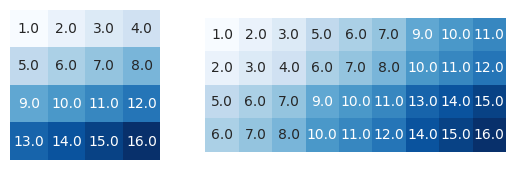

In [ ]:
X = [[1, 2, 3, 4],
     [5, 6, 7, 8],
     [9, 10, 11, 12],
     [13, 14, 15, 16]]

filter = [[1, 1, 1], [1, 1, 1], [1, 1, 1]]

visualize_im2col(X, filter)

##Convolution 계층 구현

In [ ]:
class Convolution:
    def __init__(self, W, b, stride=1, pad=0):
        self.W = W
        self.b = b
        self.stride = stride
        self.pad = pad

        self.x = None
        self.col = None
        self.col_W = None

        self.dW = None
        self.db = None

    def forward(self, x):
        FN, C, FH, FW = self.W.shape
        N, C, H, W = x.shape
        out_h = 1 + int((H + 2*self.pad - FH) / self.stride)
        out_w = 1 + int((W + 2*self.pad - FW) / self.stride)

        col = im2col(x, FH, FW, self.stride, self.pad)
        col_W = self.W.reshape(FN, -1).T

        out = np.dot(col, col_W) + self.b
        out = out.reshape(N, out_h, out_w, -1).transpose(0, 3, 1, 2)

        self.x = x
        self.col = col
        self.col_W = col_W

        return out

    def backward(self, dout):
        FN, C, FH, FW = self.W.shape
        dout = dout.transpose(0, 2, 3, 1).reshape(-1, FN)

        self.db = np.sum(dout, axis=0)
        self.dW = np.dot(self.col.T, dout)
        self.dW = self.dW.transpose(1, 0).reshape(FN, C, FH, FW)

        dcol = np.dot(dout, self.col_W.T)
        dx = col2im(dcol, self.x.shape, FH, FW, self.stride, self.pad)

        return dx

##Pooling 계층 구현

In [ ]:
class Pooling:
    def __init__(self, pool_h, pool_w, stride=1, pad=0):
        self.pool_h = pool_h
        self.pool_w = pool_w
        self.stride = stride
        self.pad = pad

        self.x = None
        self.arg_max = None

    def forward(self, x):
        N, C, H, W = x.shape
        out_h = int(1 + (H - self.pool_h) / self.stride)
        out_w = int(1 + (W - self.pool_w) / self.stride)

        col = im2col(x, self.pool_h, self.pool_w, self.stride, self.pad)
        col = col.reshape(-1, self.pool_h*self.pool_w)

        arg_max = np.argmax(col, axis=1)
        out = np.max(col, axis=1)
        out = out.reshape(N, out_h, out_w, C).transpose(0, 3, 1, 2)

        self.x = x
        self.arg_max = arg_max

        return out

    def backward(self, dout):
        dout = dout.transpose(0, 2, 3, 1)

        pool_size = self.pool_h * self.pool_w
        dmax = np.zeros((dout.size, pool_size))
        dmax[np.arange(self.arg_max.size), self.arg_max.flatten()] = dout.flatten()
        dmax = dmax.reshape(dout.shape + (pool_size,))

        dcol = dmax.reshape(dmax.shape[0] * dmax.shape[1] * dmax.shape[2], -1)
        dx = col2im(dcol, self.x.shape, self.pool_h, self.pool_w, self.stride, self.pad)

        return dx


##새로운 신경망 만들기!

1. class의 상속 기능을 이용하여, ChapterSixNetwork에서 추가할 기능(Convolution-Activation-Pooling)만을 넣고 학습을 돌려 보자.

In [ ]:
class ChapterSevenNetwork(ChapterSixNetwork):
    def __init__(self, input_dim=(1, 28, 28), hidden_size=100, output_size=10, activation='relu', weight_init_std=0.01,
                 conv_param={'filter_num':30, 'filter_size':5, 'pad':0, 'stride':1}):
        filter_num = conv_param['filter_num']
        filter_size = conv_param['filter_size']
        filter_pad = conv_param['pad']
        filter_stride = conv_param['stride']
        input_size = input_dim[1]
        conv_output_size = (input_size - filter_size + 2*filter_pad) / filter_stride + 1
        pool_output_size = int(filter_num * (conv_output_size/2) * (conv_output_size/2))

        # 가중치 초기화
        self.params = {}
        self.params['Wc'] = weight_init_std * np.random.randn(filter_num, input_dim[0], filter_size, filter_size)
        self.params['bc'] = np.zeros(filter_num)
        self.params['W1'] = weight_init_std * np.random.randn(pool_output_size, hidden_size)
        self.params['b1'] = np.zeros(hidden_size)
        self.params['W2'] = weight_init_std * np.random.randn(hidden_size, output_size)
        self.params['b2'] = np.zeros(output_size)

        # 계층 생성
        self.layers = OrderedDict()
        self.layers['Conv1'] = Convolution(self.params['Wc'], self.params['bc'], conv_param['stride'], conv_param['pad'])
        self.layers[activation + '0'] = activation_layer[activation]()
        self.layers['Pool1'] = Pooling(pool_h=2, pool_w=2, stride=2)
        self.layers['Affine1'] = Affine(self.params['W1'], self.params['b1'])
        self.layers[activation + '1'] = activation_layer[activation]()
        self.layers['Affine2'] = Affine(self.params['W2'], self.params['b2'])

        self.last_layer = SoftmaxWithLoss()


    '''Overriding'''
    def gradient(self, x, t):
        self.loss(x, t)
        dout = 1
        dout = self.last_layer.backward(dout)
        layers = list(self.layers.values())
        layers.reverse()
        for layer in layers:
            dout = layer.backward(dout)

        grads = {}
        '''**************'''
        grads['Wc'] = self.layers['Conv1'].dW
        grads['bc'] = self.layers['Conv1'].db
        '''***************'''
        grads['W1'] = self.layers['Affine1'].dW
        grads['b1'] = self.layers['Affine1'].db
        grads['W2'] = self.layers['Affine2'].dW
        grads['b2'] = self.layers['Affine2'].db

        return grads

2. 데이터 flatten 여부 바꿔 주기

In [ ]:
# Data flatten 풀기
x_train = x_train.reshape(-1, 1, 28, 28)
x_test = x_test.reshape(-1, 1, 28, 28)

3. 훈련 및 평가

In [ ]:
network2 = ChapterSevenNetwork()
network2.fit(x_train, t_train)

=== epoch:  1 | loss: 2.299947 | train acc: 8.65%
=== epoch:  2 | loss: 0.414619 | train acc: 87.70%
=== epoch:  3 | loss: 0.242314 | train acc: 91.75%
=== epoch:  4 | loss: 0.157847 | train acc: 92.48%
=== epoch:  5 | loss: 0.148993 | train acc: 94.93%
=== epoch:  6 | loss: 0.136192 | train acc: 96.20%
=== epoch:  7 | loss: 0.046756 | train acc: 97.18%
=== epoch:  8 | loss: 0.067234 | train acc: 97.62%
=== epoch:  9 | loss: 0.071571 | train acc: 98.02%
=== epoch: 10 | loss: 0.036445 | train acc: 98.43%
=== epoch: 11 | loss: 0.016759 | train acc: 98.71%
=== epoch: 12 | loss: 0.020519 | train acc: 99.00%
=== epoch: 13 | loss: 0.028436 | train acc: 98.53%
=== epoch: 14 | loss: 0.012822 | train acc: 99.07%
=== epoch: 15 | loss: 0.044653 | train acc: 98.67%
=== epoch: 16 | loss: 0.040500 | train acc: 99.41%
=== epoch: 17 | loss: 0.019307 | train acc: 99.47%
=== epoch: 18 | loss: 0.008850 | train acc: 99.69%
=== epoch: 19 | loss: 0.005782 | train acc: 99.66%
=== epoch: 20 | loss: 0.012548 |

In [ ]:
network2.accuracy(x_test, t_test)

0.9706

## Visualization

필터를 거친 이미지는 마치 전처리를 한 것과 같은 모습을 보인다. 즉, __퍼셉트론의 가중치 변화만으로 인간의 전처리를 구현__한 것과 마찬가지이다.    
이는 인공 신경망이 단순한 분류를 하는 것이 아닌 __개념화__를 한다는 의미이며, 이는 mnist 데이터셋을 통해 학습한 시각 분류법을 __다른 시각적 정보에도 적용 가능하다__는 뜻이다(초기 필터일수록 일반적인 개념이라고 해석 가능하다).     
따라서 딥러닝을 일반인공지능(AGI)의 기반으로 보기도 한다.

In [ ]:
import pickle

class PklNetwork(ChapterSevenNetwork):
    def load_params(self, file_name="params.pkl"):
        with open(file_name, 'rb') as f:
            params = pickle.load(f)
        for key, val in params.items():
            if key == 'W1':
                ckey = 'Wc'
            elif key == 'b1':
                ckey = 'bc'
            elif key == 'W2':
                ckey = 'W1'
            elif key == 'b2':
                ckey = 'b1'
            elif key == 'W3':
                ckey = 'W2'
            else:
                ckey = 'b2'
            self.params[ckey] = val


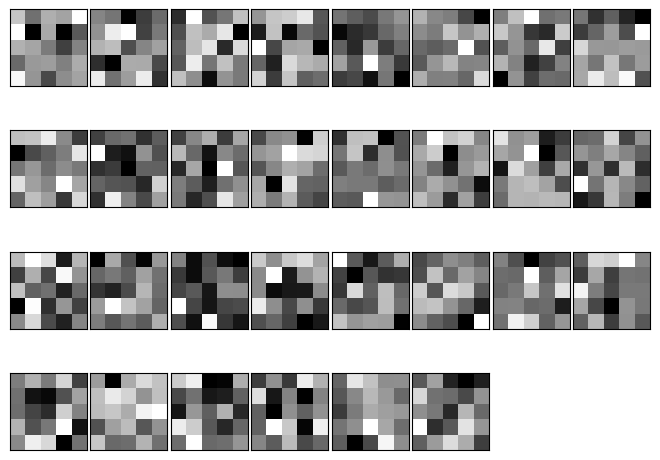

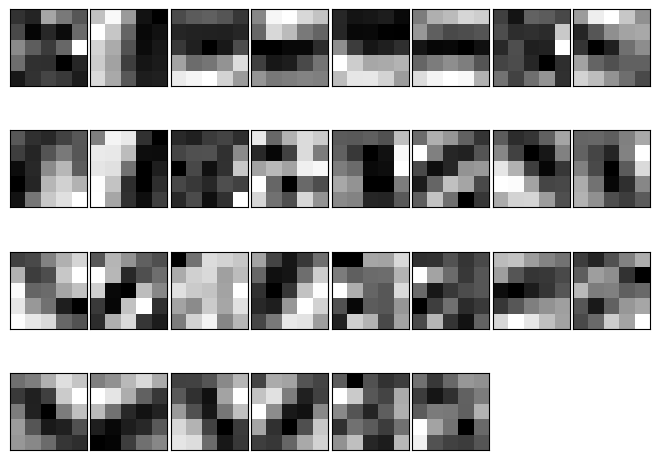

In [ ]:
def filter_show(filters, nx=8, margin=3, scale=10):
    FN, C, FH, FW = filters.shape
    ny = int(np.ceil(FN / nx))

    fig = plt.figure()
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

    for i in range(FN):
        ax = fig.add_subplot(ny, nx, i+1, xticks=[], yticks=[])
        ax.imshow(filters[i, 0], cmap=plt.cm.gray_r, interpolation='nearest')
    plt.show()


network = PklNetwork()
# 무작위(랜덤) 초기화 후의 가중치
filter_show(network.params['Wc'])

# 학습된 가중치
network.load_params("params.pkl")
filter_show(network.params['Wc'])

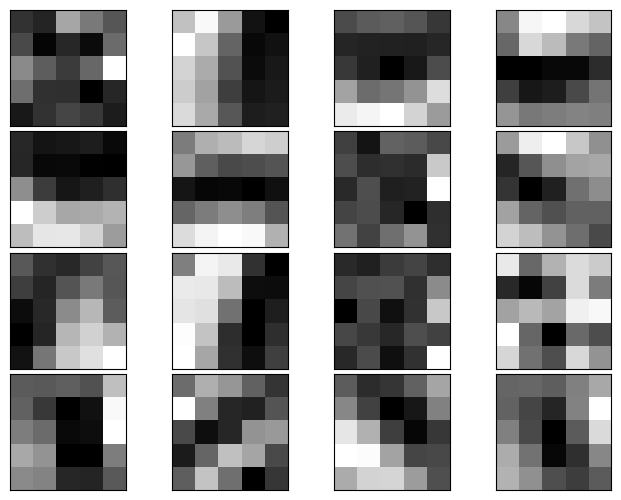

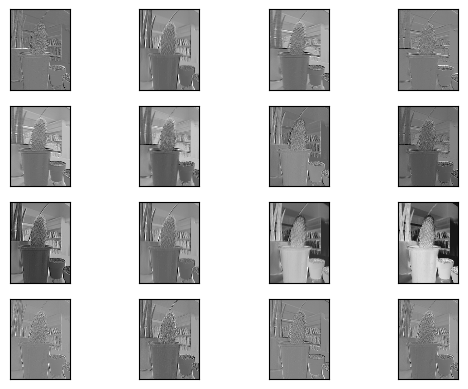

In [ ]:
from matplotlib.image import imread

def filter_show(filters, nx=4, show_num=16):
    FN, C, FH, FW = filters.shape
    ny = int(np.ceil(show_num / nx))

    fig = plt.figure()
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

    for i in range(show_num):
        ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
        ax.imshow(filters[i, 0], cmap=plt.cm.gray_r, interpolation='nearest')


network = PklNetwork()

# 학습된 가중치
network.load_params("params.pkl")

filter_show(network.params['Wc'], 16)

img = imread('cactus_gray.png')
img = img.reshape(1, 1, *img.shape)

fig = plt.figure()

w_idx = 1

for i in range(16):
    w = network.params['Wc'][i]
    b = 0  # network.params['b1'][i]

    w = w.reshape(1, *w.shape)
    #b = b.reshape(1, *b.shape)
    conv_layer = Convolution(w, b)
    out = conv_layer.forward(img)
    out = out.reshape(out.shape[2], out.shape[3])

    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    ax.imshow(out, cmap=plt.cm.gray_r, interpolation='nearest')

plt.show()